ENV: celiac_env3

In [1]:
import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl
import plotly.express as px
from adjustText import adjust_text
from tqdm import tqdm
import gseapy as gp
import os
import warnings
from datetime import datetime
from scipy.stats import zscore
import scipy
from sklearn.decomposition import PCA
import math
from scipy.sparse import issparse
from statsmodels.stats.multitest import multipletests
from scipy.stats import ranksums
import dill
import session_info2


np.random.seed(1)

warnings.filterwarnings("ignore")

mpl.rcParams['pdf.fonttype'] = 42 # to edit text in Illustrator
mpl.rcParams['ps.fonttype'] = 42
plt.rcParams.update({
    "font.size": 14,    
    "axes.titlesize": 16,    
    "axes.labelsize": 14,  
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,  
    "legend.fontsize": 14
})
RASTERIZE_PLOTS = True
LOAD_ARIAL = True
if LOAD_ARIAL:
    # set the default font to Arial
    from matplotlib.font_manager import FontProperties, fontManager
    from matplotlib import rcParams
    # Path to Arial font
    arial_path = '/mnt/x/common/joint_projects/spatial_celiac/utils/Arial.ttf'

    # Define font properties with the specific path
    arial_font = FontProperties(fname=arial_path)
    fontManager.addfont(arial_path)

    # Set the font as the default for all text elements
    rcParams['font.family'] = arial_font.get_family()
    rcParams['font.sans-serif'] = [arial_font.get_name()]

In [2]:
diagnosis_pallette = {"Control": "#8fa3ee", "Celiac": "#fac67c","control": "#8fa3ee", "celiac": "#fac67c"}

In [3]:
fig2_save_path = os.getcwd()+"/figures/fig2/"
if not os.path.exists(fig2_save_path):
    os.makedirs(fig2_save_path)

fig2_supp_save_path = os.getcwd()+"/figures/supp_tip_base_correlation/"
if not os.path.exists(fig2_supp_save_path):
    os.makedirs(fig2_supp_save_path)


## Load data

### Load Annotated visiumHD data

In [4]:
epithelial_zonation_path = os.getcwd()+"/group_com_zonation/group_com_zonation_control_epithelium.csv"
epi_df = pd.read_csv(epithelial_zonation_path)
epi_df

,gene_name,-350_mean,-250_mean,-150_mean,-50_mean,50_mean,150_mean,250_mean,350_mean,450_mean,...,-250_se,-150_se,-50_se,50_se,150_se,250_se,350_se,450_se,com,com_01
0,KRTAP12-4,0.000037,0.0,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,...,0.0,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,1.000000,0.000000
1,TEX54,0.000122,0.0,0.000000,0.000000e+00,9.512573e-07,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,...,0.0,0.000000,0.000000e+00,3.948954e-07,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,1.030847,0.003908
2,NAV3,0.000037,0.0,0.000000,0.000000e+00,5.450186e-08,3.613004e-07,0.000000e+00,0.000000e+00,0.000000,...,0.0,0.000000,0.000000e+00,4.720000e-08,3.128953e-07,0.000000e+00,0.000000e+00,0.000000,1.054807,0.006944
3,KRTAP16-1,0.000037,0.0,0.000001,0.000000e+00,5.450186e-08,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,...,0.0,0.000001,0.000000e+00,4.720000e-08,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,1.072211,0.009149
4,ATP4B,0.000122,0.0,0.000001,8.202369e-07,1.635056e-07,8.133732e-08,6.652439e-07,0.000000e+00,0.000000,...,0.0,0.000001,7.103460e-07,1.416000e-07,7.044018e-08,5.761181e-07,0.000000e+00,0.000000,1.079968,0.010132
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17907,ANKRD33,0.000000,0.0,0.000001,0.000000e+00,6.184130e-07,8.133732e-08,8.499470e-07,0.000000e+00,0.000016,...,0.0,0.000001,0.000000e+00,4.192505e-07,7.044018e-08,7.360757e-07,0.000000e+00,0.000014,8.355391,0.931885
17908,GPR156,0.000000,0.0,0.000000,0.000000e+00,3.873461e-07,0.000000e+00,1.404206e-07,4.119852e-07,0.000004,...,0.0,0.000000,0.000000e+00,2.761277e-07,0.000000e+00,1.216078e-07,3.567896e-07,0.000004,8.576105,0.959848
17909,RAX2,0.000000,0.0,0.000001,4.101184e-07,3.854799e-07,0.000000e+00,0.000000e+00,0.000000e+00,0.000033,...,0.0,0.000001,3.551730e-07,2.262127e-07,0.000000e+00,0.000000e+00,0.000000e+00,0.000028,8.678607,0.972834
17910,TLR6,0.000000,0.0,0.000000,0.000000e+00,0.000000e+00,8.133732e-08,0.000000e+00,0.000000e+00,0.000002,...,0.0,0.000000,0.000000e+00,0.000000e+00,7.044018e-08,0.000000e+00,0.000000e+00,0.000002,8.882576,0.998676


In [5]:
RATIO_THRESH = 1
EXP_THRESH = 0.0001
epi_df_filtered = epi_df[epi_df.loc[:,"villus_crypt_ratio"] >RATIO_THRESH] # select villi genes
print(epi_df_filtered.shape)
epi_df_filtered = epi_df_filtered[(epi_df_filtered.loc[:,'mean_crypt_exp'] > EXP_THRESH)|(epi_df_filtered.loc[:,'mean_villus_exp']>EXP_THRESH)]
print(epi_df_filtered.shape)

(5163, 24)
(1459, 24)


### Load Annotated single cell data

In [6]:
fast_load = True
if fast_load:
    fast_load_prefix = "/mnt/d/celiac_files/"
else:   
    fast_load_prefix = ""

In [7]:
sc_ad = sc.read_h5ad(fast_load_prefix+"10x_flex_all_samples_processed_bg.h5ad")
sc_ad

AnnData object with n_obs × n_vars = 53270 × 18129
    obs: 'sample_name', 'batch', 'clinical_group', 'processing_method', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'log10_total_counts', 'leiden', 'cell_type_lvl1', 'cell_type_lvl2', 'epi_umap1', 'epi_umap2', 'entero_umap1', 'entero_umap2', 'stroma_umap1', 'stroma_umap2', 'epi_leiden', 'stroma_leiden', 'imm_leiden', 'stroma_umap_1', 'stroma_umap_2', 'immune_umap_1', 'immune_umap_2'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 'n_cells_by_counts-

In [8]:
# sc_ad = sc.read_h5ad("10x_flex_all_samples_processed_bg.h5ad")
# sc_ad

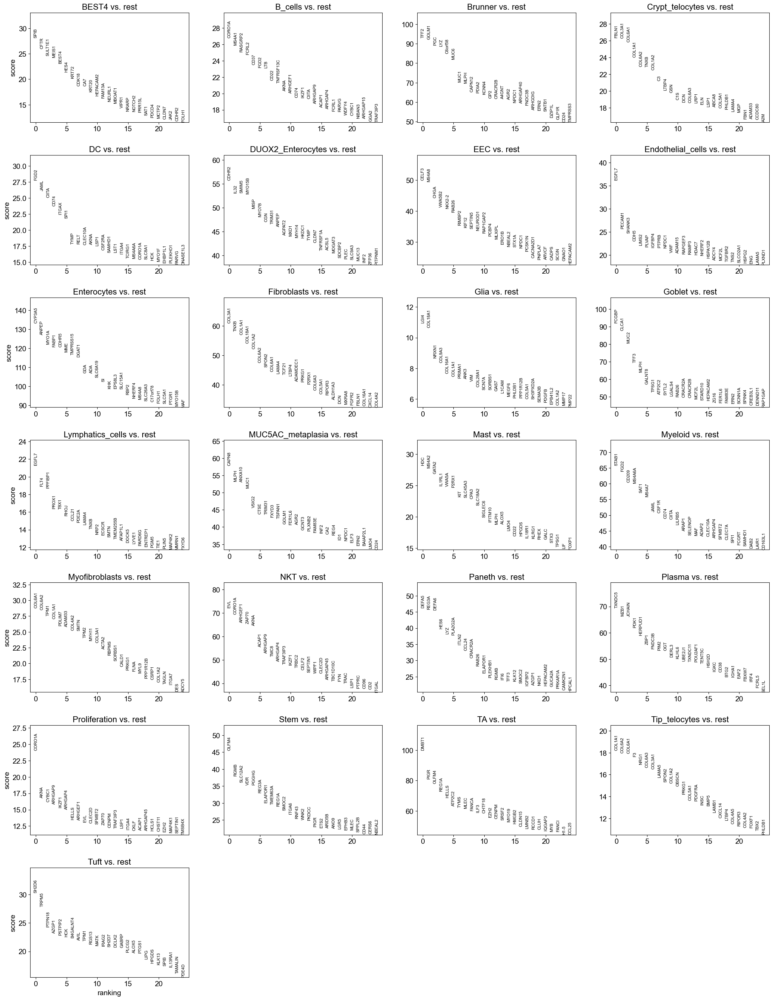

In [9]:
sc.tl.rank_genes_groups(sc_ad, groupby='cell_type_lvl2', method='wilcoxon', layer='log_norm', pts=True)
sc.pl.rank_genes_groups(sc_ad, n_genes=25, sharey=False)

### Create and export table S2 (tip mid and base markers)

In [10]:
dge_df = sc.get.rank_genes_groups_df(sc_ad, group="Enterocytes")
enterocytes_genes = dge_df.loc[(dge_df['logfoldchanges'] > 2) & (dge_df['pvals_adj'] < 0.01),"names"]
print(len(enterocytes_genes))

epi_df_enterocytes = epi_df_filtered[epi_df_filtered['gene_name'].isin(enterocytes_genes)]
epi_df_enterocytes.sort_values(by='com',inplace=True)

275


In [11]:
N_genes = 40
bottom_markers = epi_df_enterocytes.head(N_genes)['gene_name']
tip_markers = epi_df_enterocytes.tail(N_genes)['gene_name']

if len(np.intersect1d(bottom_markers, tip_markers)) > 0:
    print("Warning: overlapping genes between bottom and tip markers")
    print(np.intersect1d(bottom_markers, tip_markers))

markers_df = pd.DataFrame({'bottom_markers': bottom_markers.reset_index(drop=True), 'tip_markers': tip_markers.reset_index(drop=True)})
# sort every column alphabetically
markers_df['bottom_markers'] = markers_df['bottom_markers']#.sort_values().values
markers_df['tip_markers'] = markers_df['tip_markers']#.sort_values().values
markers_df
# print(f'tip markers: {len(tip_markers)}, bottom markers: {len(bottom_markers)}')
# print(f"tip markers: {tip_markers.tolist()}")
# print(f"bottom markers: {bottom_markers.tolist()}")

,bottom_markers,tip_markers
0,EXOC3L4,MS4A10
1,AKAP7,SLC6A4
2,EPS8L3,SGK1
3,KHK,CD36
4,AADAC,UGT1A1
5,RAB17,ASAH2
6,PBLD,MEP1B
7,PTGR1,SOAT2
8,SI,EDN3
9,DEPDC7,NR0B2


In [12]:
tmp_mid = epi_df_enterocytes.copy()
tmp_mid.index = tmp_mid['gene_name']
mid_v_cols = ["250_mean"]
peripheral_v_cols = ["50_mean","150_mean","350_mean","450_mean"]
tmp_mid.loc[:,peripheral_v_cols].max(axis=1)
mid_ratio = tmp_mid.loc[:,mid_v_cols].mean(axis=1) / tmp_mid.loc[:,peripheral_v_cols].max(axis=1)
EXP_THRESH = 1e-4
RATIO_THRESH = 1
exp_mask = tmp_mid[['mean_villus_exp','mean_crypt_exp']].max(axis=1) > EXP_THRESH
ratio_mask = mid_ratio > RATIO_THRESH
mid_exp_genes = tmp_mid[exp_mask & ratio_mask].index.tolist()
mid_genes = tmp_mid[exp_mask & ratio_mask].index.tolist()
print(f'Number of mid genes: {len(mid_genes)}')
mid_genes

Number of mid genes: 14


['CYP2C9',
 'SLC4A7',
 'EPS8L2',
 'MYO7B',
 'ADH4',
 'ACAA1',
 'SLC36A1',
 'PTPRH',
 'SCIN',
 'PHLPP2',
 'GDPD2',
 'GAL3ST1',
 'DHDH',
 'SLC6A4']

In [13]:
# # find median com for tip and bottom markers
# tip_median_com = epi_df_enterocytes[epi_df_enterocytes['gene_name'].isin(tip_markers)]['com'].median()
# bottom_median_com = epi_df_enterocytes[epi_df_enterocytes['gene_name'].isin(bottom_markers)]['com'].median()
# print(f'Tip median COM: {tip_median_com}, Bottom median COM: {bottom_median_com}')

# # midpoint between tip and bottom median coms
# midpoint_com = (tip_median_com + bottom_median_com) / 2
# print(f'Midpoint COM: {midpoint_com}')

# # find genes around this point
# mid_epi_com = epi_df_enterocytes[['gene_name','com']].copy()
# mid_epi_com['com_dist_from_midpoint'] = np.abs(mid_epi_com['com'] - midpoint_com)
# mid_epi_com.sort_values(by='com_dist_from_midpoint',inplace=True)
# mid_genes = mid_epi_com.head(40)['gene_name']

In [14]:
markers_df.loc[range(len(mid_genes)),'mid_markers'] = mid_genes#.reset_index(drop=True)

# identify overlap in table
duplicates = markers_df.duplicated(subset=['bottom_markers', 'mid_markers', 'tip_markers'], keep=False)
if duplicates.any():
    print("Duplicates found in the dataframe:")
    print(markers_df[duplicates])
else:
    print("No duplicates found in the dataframe.")

# reorder columns
markers_df = markers_df[['bottom_markers', 'mid_markers', 'tip_markers']]
markers_df

No duplicates found in the dataframe.


,bottom_markers,mid_markers,tip_markers
0,EXOC3L4,CYP2C9,MS4A10
1,AKAP7,SLC4A7,SLC6A4
2,EPS8L3,EPS8L2,SGK1
3,KHK,MYO7B,CD36
4,AADAC,ADH4,UGT1A1
5,RAB17,ACAA1,ASAH2
6,PBLD,SLC36A1,MEP1B
7,PTGR1,PTPRH,SOAT2
8,SI,SCIN,EDN3
9,DEPDC7,PHLPP2,NR0B2


In [15]:
# export markers_df to csv
markers_df.to_csv("enterocyte_zonation_markers.csv", index=False)

In [16]:
# for every enterocyte (V1,V2,V3) compute sum of tip and bottom markers
# enterocytes_zones = ['V1','V2','V3']
entero_ad = sc_ad[sc_ad.obs['cell_type_lvl2']=='Enterocytes', :] # ,"TA"

# select cells with minimum 1000 counts
entero_ad = entero_ad[entero_ad.obs['total_counts'] >= 1000, :]

# Compute tip and bottom scores
entero_ad.obs['tip_score'] = entero_ad[:, tip_markers].layers['mat_norm'].sum(axis=1).A1
entero_ad.obs['bottom_score'] = entero_ad[:, bottom_markers].layers['mat_norm'].sum(axis=1).A1

## All cells in all patients

Tip vs Bottom scores per Enterocyte: r=-0.07, p=1.40e-07 (control)
fraction of control:0.22512
Tip vs Bottom scores per Enterocyte: r=0.71, p=0.00e+00 (celiac)
fraction of celiac:0.4029567854435178


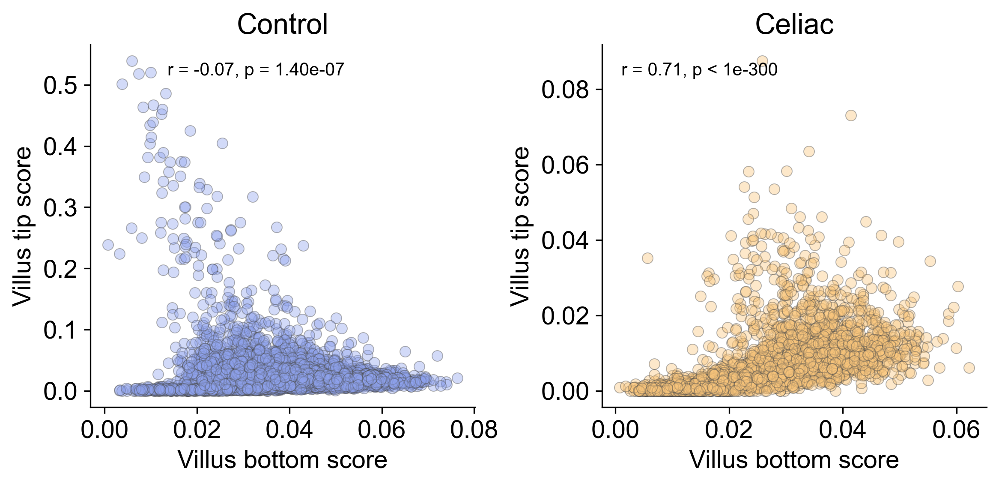

In [17]:
disease_groups = entero_ad.obs['clinical_group'].dropna().unique()[::-1]

pt_corr_df = pd.DataFrame(columns=['sample_name','clinical_group','spearman_r','p_value'])

# scatter plot of tip vs bottom scores
FIG_SIDE = 4
PRCT = 50
loc_dict = {'control': 0.2,'celiac':0.05}
corr_df = pd.DataFrame(columns=['clinical_group','spearman_r','p_value',"n_cells","n_patients"])
fig,ax=plt.subplots(figsize=(FIG_SIDE*len(disease_groups),FIG_SIDE), nrows=1, ncols=len(disease_groups), dpi=300)
sns.despine()
for ii, my_group in enumerate(['control','celiac']):
    my_ad = entero_ad[entero_ad.obs['clinical_group'] == my_group]

    median_tip_score = np.percentile(my_ad.obs['tip_score'], PRCT)
    median_bottom_score = np.percentile(my_ad.obs['bottom_score'], PRCT)

    my_corr = scipy.stats.spearmanr(my_ad.obs['tip_score'], my_ad.obs['bottom_score'])
    corr_df = pd.concat([corr_df, pd.DataFrame({'clinical_group':[my_group], 'spearman_r':[my_corr.correlation], 'p_value':[my_corr.pvalue], 
        "n_cells":[my_ad.obs.shape[0]], "n_patients":[my_ad.obs['sample_name'].nunique()]})], ignore_index=True)

    sns.scatterplot(data=my_ad.obs, x='bottom_score', y='tip_score',
     alpha=0.4, ax=ax[ii], edgecolor="#4b4b4b", color=diagnosis_pallette[my_group.capitalize()])
    print('Tip vs Bottom scores per Enterocyte: r={:.2f}, p={:.2e} ({})'.format(my_corr.correlation, my_corr.pvalue, my_group))
    if my_corr.pvalue == 0:
        ax[ii].text(loc_dict[my_group],0.95, f"r = {my_corr.correlation:.2f}, p < 1e-300", transform=ax[ii].transAxes, 
                fontsize=10, verticalalignment='top',)
    else:
        ax[ii].text(loc_dict[my_group],0.95, f"r = {my_corr.correlation:.2f}, p = {my_corr.pvalue:.2e}", transform=ax[ii].transAxes, 
                fontsize=10, verticalalignment='top',)
    ax[ii].set_ylabel('Villus tip score')
    ax[ii].set_xlabel('Villus bottom score')
    ax[ii].set_title(rf"{my_group.capitalize()}")
    # add xline at median of bottom score
    # ax[ii].axvline(median_bottom_score, color='black', linestyle='--', linewidth=1)
    # ax[ii].axhline(median_tip_score, color='black', linestyle='--', linewidth=1)

    for coll in ax[ii].collections:
        coll.set_rasterized(True)

    double_positive = np.sum((my_ad.obs['tip_score'] > median_tip_score) & (my_ad.obs['bottom_score'] > median_bottom_score))
    print(f"fraction of {my_group}:{double_positive/my_ad.n_obs }")

    # calculate sample-specific correlations
    for sample in my_ad.obs['sample_name'].unique():
        sample_ad = my_ad[my_ad.obs['sample_name'] == sample]
        sample_corr = scipy.stats.spearmanr(sample_ad.obs['tip_score'], sample_ad.obs['bottom_score'])
        pt_corr_df = pd.concat([pt_corr_df, pd.DataFrame({'sample_name':[sample],'clinical_group':[my_group], 'spearman_r':[sample_corr.correlation], 'p_value':[sample_corr.pvalue]})], ignore_index=True)

plt.tight_layout()
plt.show()
fig.savefig(fig2_supp_save_path+"/fig_2_enterocytes_tip_bottom_scores_scatters.pdf", bbox_inches='tight')

In [18]:
from matplotlib.colors import LinearSegmentedColormap
def truncate_colormap(cmap, minval=0.3, maxval=1.0, n=256):
    return LinearSegmentedColormap.from_list(
        f'trunc({cmap.name},{minval},{maxval})',
        cmap(np.linspace(minval, maxval, n))
    )
light_viridis = truncate_colormap(plt.cm.viridis, 0.3, 1.0)

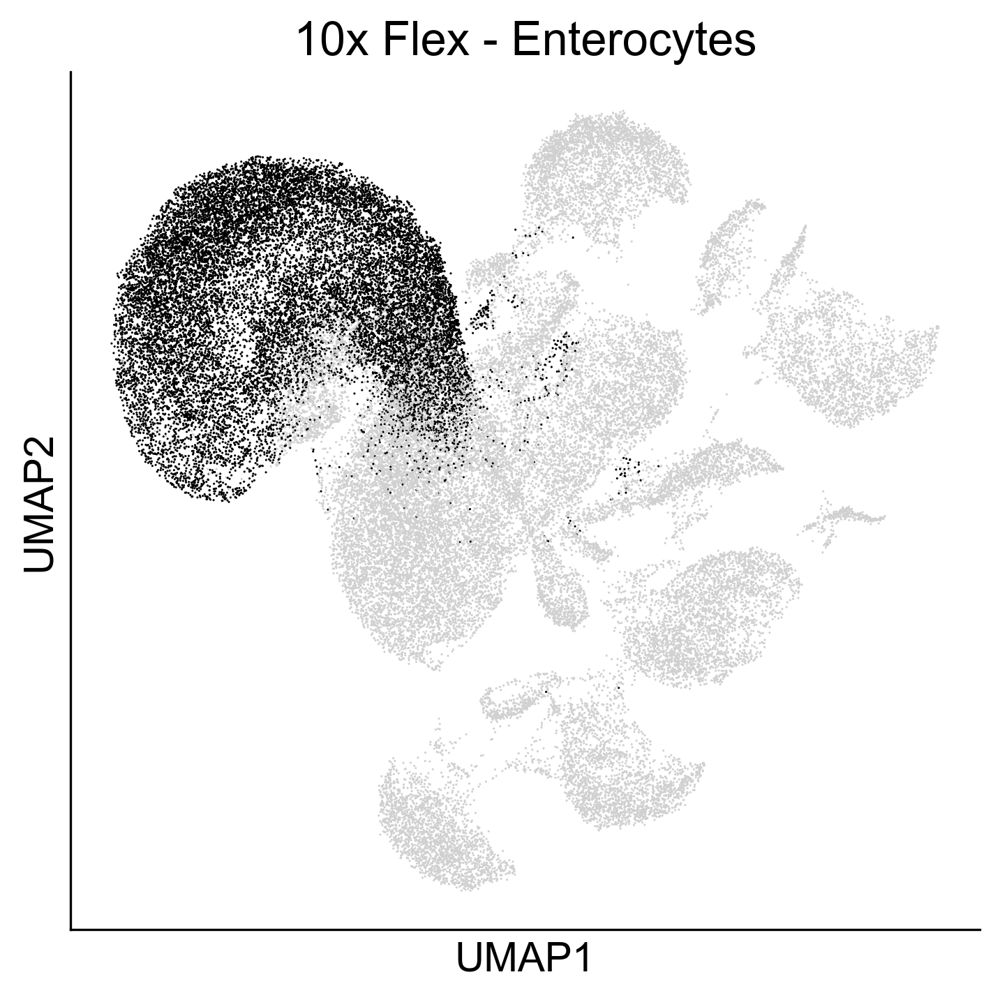

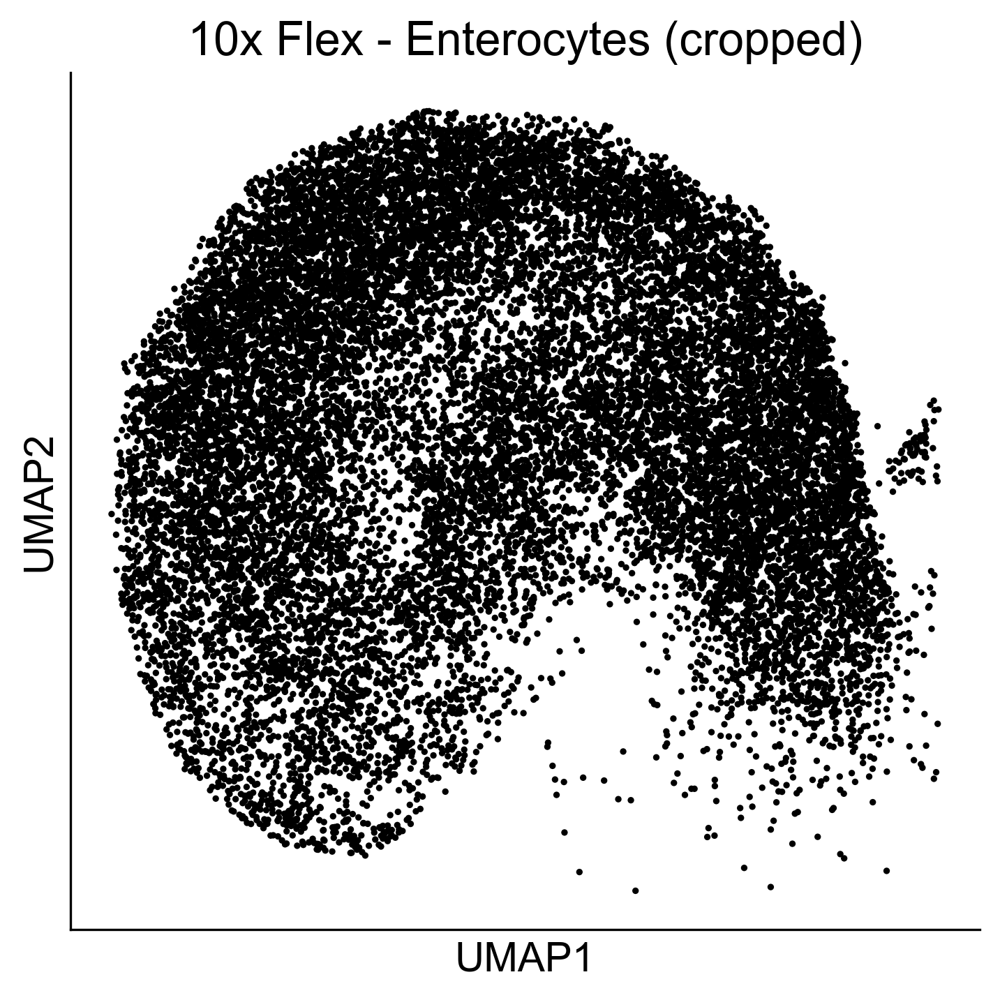

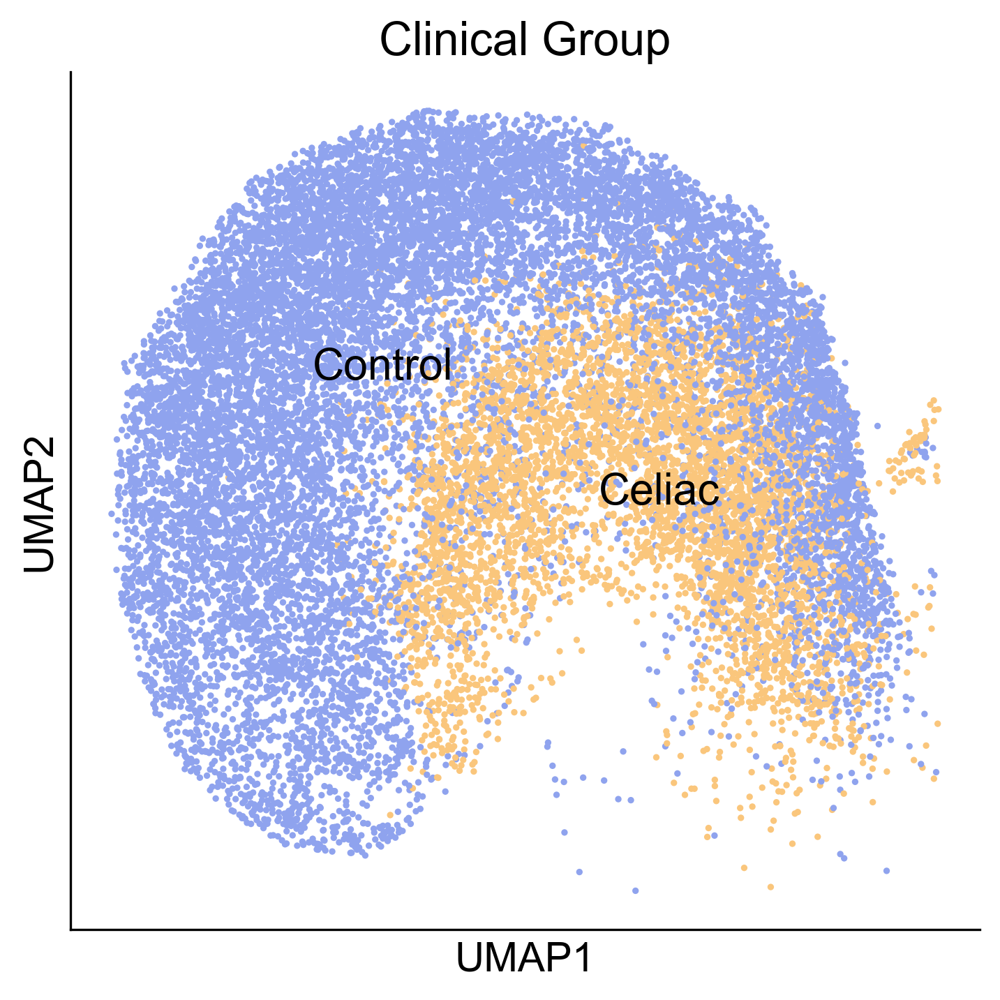

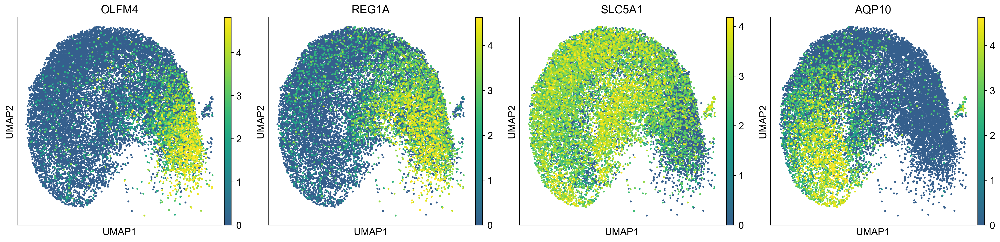

In [19]:
color_pallette = {"control": "#8fa3ee", "celiac": "#fac67c"}

adata_tmp = sc_ad.copy()
adata_tmp.obs['group_positive'] = adata_tmp.obs['cell_type_lvl2'].astype('str')
# make Enterocytes True 
adata_tmp.obs['group_positive'] = adata_tmp.obs['group_positive'] == 'Enterocytes'
# map True and False to "Enterocytes" and "Other"
adata_tmp.obs['group_positive'] = adata_tmp.obs['group_positive'].map({True: "Enterocytes", False: "Other"})
fig, ax = plt.subplots(figsize=(5, 5), dpi=300)
sns.despine()
sc.pl.umap(adata_tmp, color=['group_positive'], palette={"Enterocytes": "#000000", "Other": "#d0d0d0"}, ax=ax, show=False)

# # add line to UMAP x and y
# ax.axhline(4, color='gray', linestyle='-')
# ax.axvline(2, color='gray', linestyle='--')

ax.get_legend().remove()
plt.title("10x Flex - Enterocytes")
plt.tight_layout()
plt.show()

# crop by UMAP coordinates: x smaller than 2 and y larger than 4
adata_tmp = adata_tmp[(adata_tmp.obsm['X_umap'][:,0] < 2) & (adata_tmp.obsm['X_umap'][:,1] > 4)].copy()
# select only enterocytes
adata_tmp = adata_tmp[adata_tmp.obs['cell_type_lvl2'] == 'Enterocytes']
fig, ax = plt.subplots(figsize=(5, 5), dpi=300)
sns.despine()
sc.pl.umap(adata_tmp, color=['group_positive'], palette={"Enterocytes": "#000000", "Other": "#d0d0d0"},
            ax=ax, show=False, size=20)
ax.get_legend().remove()
plt.title("10x Flex - Enterocytes (cropped)")
plt.tight_layout()
plt.show()

# plot clinical_group
fig, ax = plt.subplots(figsize=(5, 5), dpi=300)
sns.despine()
sc.pl.umap(adata_tmp, color=['clinical_group'], palette=color_pallette, ax=ax, show=False, 
    size=20, legend_loc='on data')
for text in ax.texts:
    text.set_text(text.get_text().capitalize())
    text.set_fontsize(15)  # Increase text size
    # text.set_path_effects([mpl.patheffects.withStroke(linewidth=1, foreground='white')])

# rasterize
for coll in ax.collections:
        coll.set_rasterized(True)

plt.title("Clinical Group")
plt.tight_layout()
fig.savefig(fig2_save_path+"/Fig_2D_enterocytes_umap_cropped_clinical_group.pdf", bbox_inches='tight')
plt.show()


# subplot the following genes: OLFM4, REG1A, SLC5A1, APOA4
genes_to_plot = ["OLFM4", "REG1A", "SLC5A1", "AQP10"]
FIG_SIZE = (20, 5)  # Adjust figure size for a linear layout
fig, axs = plt.subplots(1, 4, figsize=FIG_SIZE, dpi=300)  # Create a single row of subplots
for i, gene in enumerate(genes_to_plot):
    ax = axs[i]
    sns.despine()
    sc.pl.umap(adata_tmp, color=[gene], vmax='p99', ax=ax, show=False, layer='log_norm', cmap=light_viridis, size=30)
    ax.set_title(gene)

    # only ints at the colorbar
    cbar = ax.collections[0].colorbar
    if cbar:
        cbar.ax.yaxis.set_major_locator(plt.MaxNLocator(integer=True))

    if RASTERIZE_PLOTS:
        ax.collections[0].set_rasterized(True)
plt.tight_layout()
plt.show()
# save figure
fig.savefig(fig2_save_path+"/Fig_2_enterocytes_genes_umap_ALL.pdf", bbox_inches='tight')

Ranksum test between clinical groups:
RanksumsResult(statistic=np.float64(-2.7386127875258306), pvalue=np.float64(0.00616989932054416))


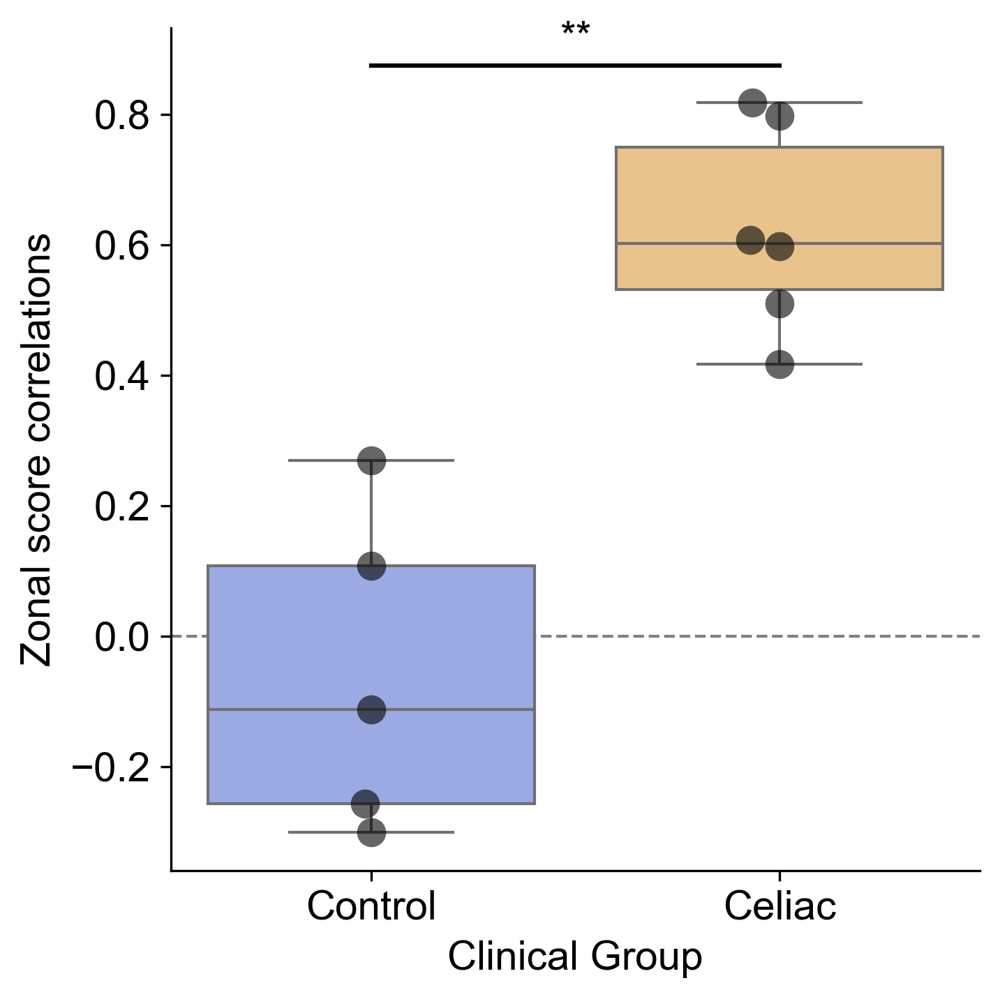

In [20]:
# perform ranksum test between clinical groups
control_r = pt_corr_df[pt_corr_df['clinical_group'] == 'control']['spearman_r']
celiac_r = pt_corr_df[pt_corr_df['clinical_group'] == 'celiac']['spearman_r']
my_ranksum = ranksums(control_r, celiac_r)
print("Ranksum test between clinical groups:")
print(my_ranksum)

fig,ax=plt.subplots(figsize=(5,5),dpi=300)
sns.despine()
sns.boxplot(pt_corr_df, x='clinical_group', y='spearman_r', order=['control', 'celiac'], palette=diagnosis_pallette.values())
sns.swarmplot(pt_corr_df, x='clinical_group', y='spearman_r', order=['control', 'celiac'], color='black', alpha=0.6, s=10)

# add significance asterisks
y_max = pt_corr_df['spearman_r'].max()
y_min = pt_corr_df['spearman_r'].min()
y, h, col = y_max + 0.05*(y_max - y_min), 0.01*(y_max - y_min), 'k'
ax.plot([0, 1], [y, y], lw=1.5, c=col)
astricks_dict = {0.05: "*", 0.01: "**", 0.001: "***"}
p_val = my_ranksum.pvalue
for p_thresh in sorted(astricks_dict.keys(), reverse=False):
    if p_val < p_thresh:
        ax.text((0+1)*.5, y+h, astricks_dict[p_thresh], ha='center', va='bottom', color=col, fontsize=14)
        break

# capitalize xticks
ax.set_xticklabels([x.get_text().capitalize() for x in ax.get_xticklabels()])

# add horizontal line at x=0, behind the boxplots
ax.axhline(0, color='gray', linestyle='--', linewidth=1, zorder=0)

plt.ylabel("Zonal score correlations")
plt.xlabel("Clinical Group")
plt.tight_layout()
plt.show()
fig.savefig(fig2_save_path+"/Fig_2F_enterocytes_tip_bottom_scores_ranksum.pdf", bbox_inches='tight')

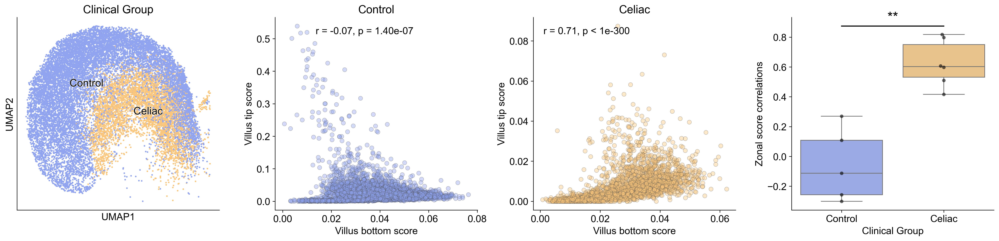

In [21]:
# create a linear subplot with the following: clinical_group umap, tip_score vs bottom_score in control and celiac, boxplot
FIG_SIDE = 5
fig,axs=plt.subplots(1,4, figsize=(FIG_SIDE*4,FIG_SIDE), dpi=300)
sns.despine()
# clinical group umap
sc.pl.umap(adata_tmp, color=['clinical_group'], palette=color_pallette, ax=axs[0], show=False, 
    size=20, legend_loc='on data')
for text in axs[0].texts:
    text.set_text(text.get_text().capitalize())
    text.set_fontsize(15)  # Increase text size
    text.set_path_effects([mpl.patheffects.withStroke(linewidth=1, foreground='white')])
axs[0].set_title("Clinical Group")
if RASTERIZE_PLOTS:
    axs[0].collections[0].set_rasterized(True)

# tip vs bottom score control
for ii, my_group in enumerate(['control','celiac']):
    my_ad = entero_ad[entero_ad.obs['clinical_group'] == my_group]

    median_tip_score = np.percentile(my_ad.obs['tip_score'], PRCT)
    median_bottom_score = np.percentile(my_ad.obs['bottom_score'], PRCT)

    my_corr = scipy.stats.spearmanr(my_ad.obs['tip_score'], my_ad.obs['bottom_score'])

    sns.scatterplot(data=my_ad.obs, x='bottom_score', y='tip_score',
     alpha=0.4, ax=axs[ii+1], edgecolor="#4b4b4b", color=diagnosis_pallette[my_group.capitalize()])
    axs[ii+1].set_ylabel('Villus tip score')
    axs[ii+1].set_xlabel('Villus bottom score')
    axs[ii+1].set_title(rf"{my_group.capitalize()}")
    # add text
    if my_corr.pvalue == 0:
        axs[ii+1].text(loc_dict[my_group],0.95, f"r = {my_corr.correlation:.2f}, p < 1e-300", transform=axs[ii+1].transAxes, 
                fontsize=14, verticalalignment='top',)
    else:
        axs[ii+1].text(loc_dict[my_group],0.95, f"r = {my_corr.correlation:.2f}, p = {my_corr.pvalue:.2e}", transform=axs[ii+1].transAxes, 
                fontsize=14, verticalalignment='top',)
    if RASTERIZE_PLOTS:
        axs[ii+1].collections[0].set_rasterized(True)

# boxplot
sns.boxplot(pt_corr_df, x='clinical_group', y='spearman_r', order=['control', 'celiac'], palette=diagnosis_pallette.values(), ax=axs[3])
sns.swarmplot(pt_corr_df, x='clinical_group', y='spearman_r', order=['control', 'celiac'], color='black', alpha=0.6, ax=axs[3])
# add significance asterisks
y_max = pt_corr_df['spearman_r'].max()
y_min = pt_corr_df['spearman_r'].min()
y, h, col = y_max + 0.05*(y_max - y_min), 0.01*(y_max - y_min), 'k'
axs[3].plot([0, 1], [y, y], lw=1.5, c=col)
astricks_dict = {0.05: "*", 0.01: "**", 0.001: "***"}
p_val = my_ranksum.pvalue
for p_thresh in sorted(astricks_dict.keys(), reverse=False):
    if p_val < p_thresh:
        axs[3].text((0+1)*.5, y+h, astricks_dict[p_thresh], ha='center', va='bottom', color=col, fontsize=20)
        break
# capitalize xticks
axs[3].set_xticklabels([x.get_text().capitalize() for x in axs[3].get_xticklabels()])
axs[3].set_ylabel("Zonal score correlations")
axs[3].set_xlabel("Clinical Group")
plt.tight_layout()
plt.show()

# save fig
# fig.savefig("figures/fig_2_enterocytes_correlation_panels.pdf", bbox_inches='tight')

## Control only figures

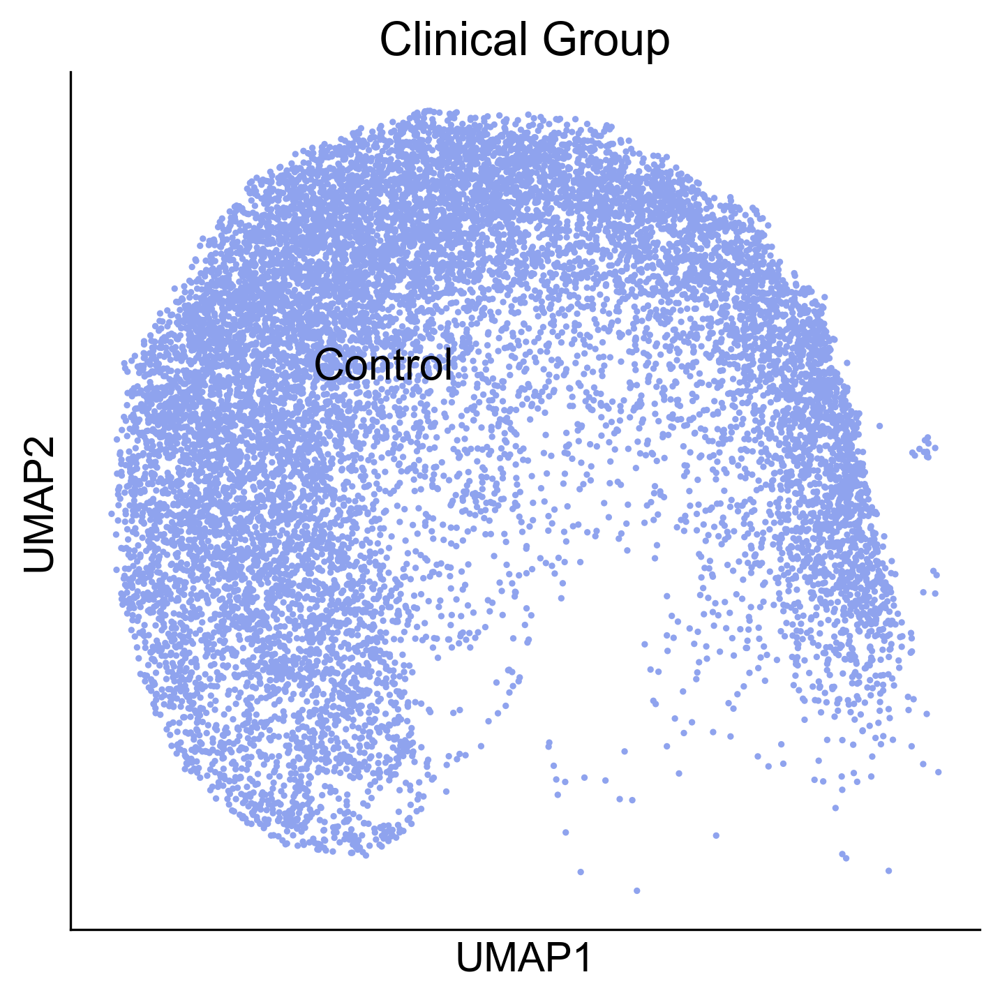

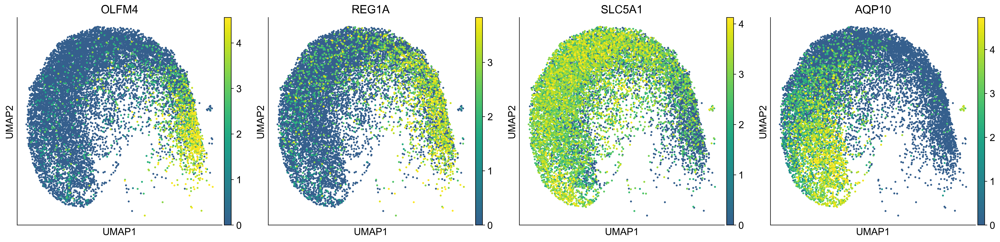

In [22]:
# same figures - CONTROLS only
adata_tmp = sc_ad.copy()
adata_tmp.obs['group_positive'] = adata_tmp.obs['cell_type_lvl2'].astype('str')
# make Enterocytes True 
adata_tmp.obs['group_positive'] = adata_tmp.obs['group_positive'] == 'Enterocytes'
# map True and False to "Enterocytes" and "Other"
adata_tmp.obs['group_positive'] = adata_tmp.obs['group_positive'].map({True: "Enterocytes", False: "Other"})


# crop by UMAP coordinates: x smaller than 2 and y larger than 4
adata_tmp = adata_tmp[(adata_tmp.obsm['X_umap'][:,0] < 2) & (adata_tmp.obsm['X_umap'][:,1] > 4)].copy()
# select only enterocytes
adata_tmp = adata_tmp[adata_tmp.obs['cell_type_lvl2'] == 'Enterocytes']

# select only controls
adata_tmp = adata_tmp[adata_tmp.obs['clinical_group'] == 'control']

FIG_SIDE = 5
# fig,axs=plt.subplots(1,1, figsize=(FIG_SIDE,FIG_SIDE), dpi=300)
# sns.despine()
# # clinical group umap
# sc.pl.umap(adata_tmp, color=['clinical_group'], palette=color_pallette, ax=axs[0], show=False, 
#     size=20, legend_loc='on data')
# for text in axs.texts:
#     text.set_text(text.get_text().capitalize())
#     text.set_fontsize(15)  # Increase text size
#     text.set_path_effects([mpl.patheffects.withStroke(linewidth=1, foreground='white')])
# axs.set_title("Clinical Group")
# if RASTERIZE_PLOTS:
#     axs.collections.set_rasterized(True)
# plt.show()

# plot clinical_group
fig, ax = plt.subplots(figsize=(5, 5), dpi=300)
sns.despine()
sc.pl.umap(adata_tmp, color=['clinical_group'], palette=color_pallette, ax=ax, show=False, 
    size=20, legend_loc='on data')
for text in ax.texts:
    text.set_text(text.get_text().capitalize())
    text.set_fontsize(15)  # Increase text size
    # text.set_path_effects([mpl.patheffects.withStroke(linewidth=1, foreground='white')])

# rasterize
for coll in ax.collections:
        coll.set_rasterized(True)

plt.title("Clinical Group")
plt.tight_layout()
fig.savefig(fig2_save_path+"/Fig_2_enterocytes_umap_cropped_clinical_group_CONTROLS.pdf", bbox_inches='tight')
plt.show()


# subplot the following genes: OLFM4, REG1A, SLC5A1, APOA4
genes_to_plot = ["OLFM4", "REG1A", "SLC5A1", "AQP10"]
FIG_SIZE = (20, 5)  # Adjust figure size for a linear layout
fig, axs = plt.subplots(1, 4, figsize=FIG_SIZE, dpi=300)  # Create a single row of subplots
for i, gene in enumerate(genes_to_plot):
    ax = axs[i]
    sns.despine()
    sc.pl.umap(adata_tmp, color=[gene], vmax='p99', ax=ax, show=False, layer='log_norm', cmap=light_viridis, size=30)
    ax.set_title(gene)

    # only ints at the colorbar
    cbar = ax.collections[0].colorbar
    if cbar:
        cbar.ax.yaxis.set_major_locator(plt.MaxNLocator(integer=True))

    if RASTERIZE_PLOTS:
        ax.collections[0].set_rasterized(True)
plt.tight_layout()
plt.show()
# save figure
fig.savefig(fig2_save_path+"/Fig_2A_enterocytes_genes_umap_CONTROLS.pdf", bbox_inches='tight')

## Specific gene modules

In [23]:
tg_synthesis_genes = ["MOGAT3","MOGAT2","DGAT1"]
cm_assembly_genes = ["CIDEB","MTTP","CD36","FABP2","DGAT2","APOB"]

entero_ad_gm = sc_ad[sc_ad.obs['cell_type_lvl2']=='Enterocytes', :] # ,"TA"

# select cells with minimum 1000 counts
entero_ad_gm = entero_ad_gm[entero_ad_gm.obs['total_counts'] >= 1000, :]

# Compute tip and bottom scores
tg_name = 'tg_score'
tg_axis_name = "TG synthesis sum"
cm_name = 'cm_score'
cm_axis_name = "Chylomicron assembly sum"

entero_ad_gm.obs[tg_name] = entero_ad_gm[:, tg_synthesis_genes].layers['mat_norm'].sum(axis=1)
entero_ad_gm.obs[cm_name] = entero_ad_gm[:, cm_assembly_genes].layers['mat_norm'].sum(axis=1)

Tip vs Bottom scores per Enterocyte: r=0.15, p=1.71e-34 (control)
fraction of control:0.0
Tip vs Bottom scores per Enterocyte: r=0.35, p=6.12e-75 (celiac)
fraction of celiac:0.0


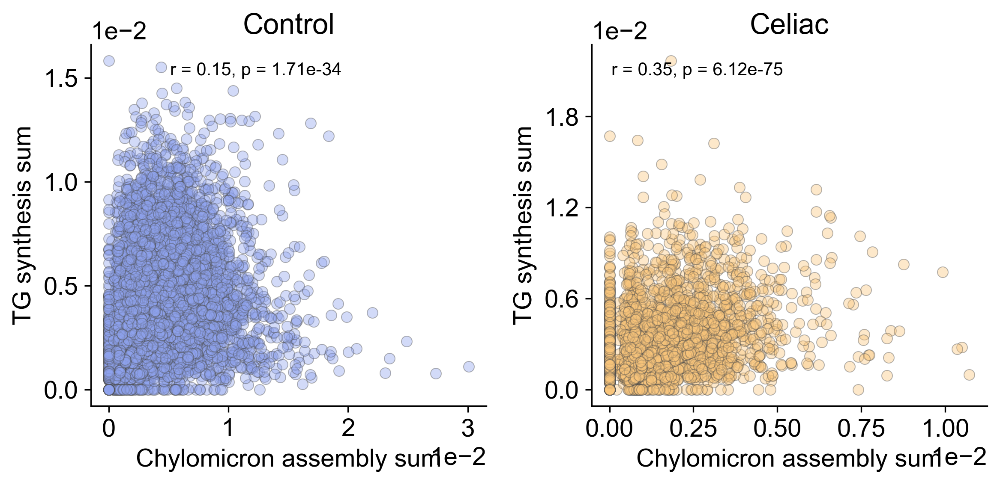

In [24]:
disease_groups = entero_ad_gm.obs['clinical_group'].dropna().unique()[::-1]

pt_corr_df_gm = pd.DataFrame(columns=['sample_name','clinical_group','spearman_r','p_value'])

# scatter plot of tip vs bottom scores
FIG_SIDE = 4
loc_dict = {'control': 0.2,'celiac':0.05}
corr_df_gm = pd.DataFrame(columns=['clinical_group','spearman_r','p_value',"n_cells","n_patients"])
fig,ax=plt.subplots(figsize=(FIG_SIDE*len(disease_groups),FIG_SIDE), nrows=1, ncols=len(disease_groups), dpi=300)
sns.despine()
for ii, my_group in enumerate(['control','celiac']):
    my_ad = entero_ad_gm[entero_ad_gm.obs['clinical_group'] == my_group]

    my_corr = scipy.stats.spearmanr(my_ad.obs[tg_name], my_ad.obs[cm_name])
    corr_df_gm = pd.concat([corr_df_gm, pd.DataFrame({'clinical_group':[my_group], 'spearman_r':[my_corr.correlation], 'p_value':[my_corr.pvalue], 
        "n_cells":[my_ad.obs.shape[0]], "n_patients":[my_ad.obs['sample_name'].nunique()]})], ignore_index=True)

    sns.scatterplot(data=my_ad.obs, x=cm_name, y=tg_name,
     alpha=0.4, ax=ax[ii], edgecolor="#4b4b4b", color=diagnosis_pallette[my_group.capitalize()])
    print('Tip vs Bottom scores per Enterocyte: r={:.2f}, p={:.2e} ({})'.format(my_corr.correlation, my_corr.pvalue, my_group))
    if my_corr.pvalue == 0:
        ax[ii].text(loc_dict[my_group],0.95, f"r = {my_corr.correlation:.2f}, p < 1e-300", transform=ax[ii].transAxes, 
                fontsize=10, verticalalignment='top',)
    else:
        ax[ii].text(loc_dict[my_group],0.95, f"r = {my_corr.correlation:.2f}, p = {my_corr.pvalue:.2e}", transform=ax[ii].transAxes, 
                fontsize=10, verticalalignment='top',)
    ax[ii].set_ylabel(tg_axis_name)
    ax[ii].set_xlabel(cm_axis_name)
    ax[ii].set_title(rf"{my_group.capitalize()}")

    # set ytick scientific
    ax[ii].ticklabel_format(style='scientific', axis='y', scilimits=(0, 0))
    ax[ii].ticklabel_format(style='scientific', axis='x', scilimits=(0, 0))
    ax[ii].yaxis.set_major_locator(plt.MaxNLocator(4))

    for coll in ax[ii].collections:
        coll.set_rasterized(True)

    double_positive = np.sum((my_ad.obs[tg_name] > median_tip_score) & (my_ad.obs[cm_name] > median_bottom_score))
    print(f"fraction of {my_group}:{double_positive/my_ad.n_obs }")

    # calculate sample-specific correlations
    for sample in my_ad.obs['sample_name'].unique():
        sample_ad = my_ad[my_ad.obs['sample_name'] == sample]
        sample_corr = scipy.stats.spearmanr(sample_ad.obs[tg_name], sample_ad.obs[cm_name])
        pt_corr_df_gm = pd.concat([pt_corr_df_gm, pd.DataFrame({'sample_name':[sample],'clinical_group':[my_group], 'spearman_r':[sample_corr.correlation], 'p_value':[sample_corr.pvalue]})], ignore_index=True)

plt.tight_layout()
plt.show()
fig.savefig(fig2_supp_save_path+"/fig_supp_enterocytes_CM_TG_scores_scatters.pdf", bbox_inches='tight')

Ranksum test between clinical groups:
RanksumsResult(statistic=np.float64(-2.1908902300206643), pvalue=np.float64(0.028459736916310565))


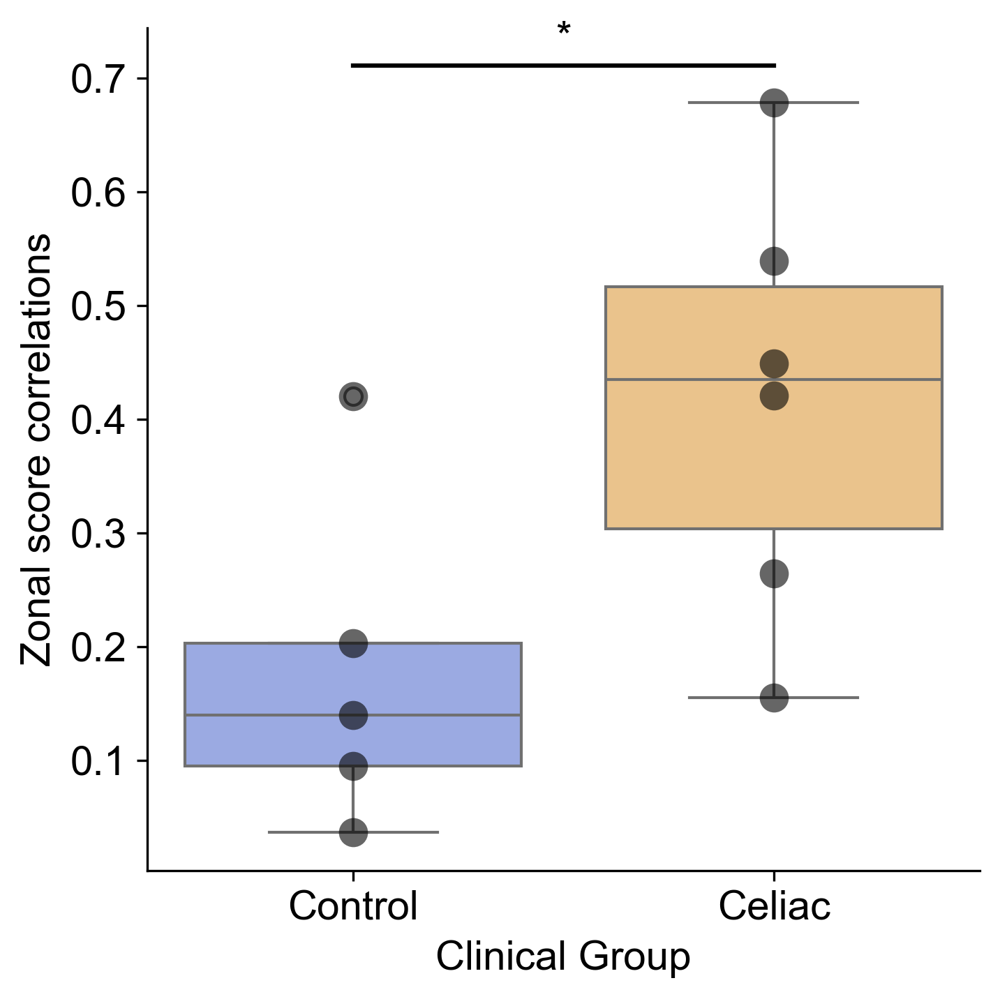

In [25]:
# perform ranksum test between clinical groups
control_r = pt_corr_df_gm[pt_corr_df_gm['clinical_group'] == 'control']['spearman_r']
celiac_r = pt_corr_df_gm[pt_corr_df_gm['clinical_group'] == 'celiac']['spearman_r']
my_ranksum = ranksums(control_r, celiac_r)
print("Ranksum test between clinical groups:")
print(my_ranksum)

fig,ax=plt.subplots(figsize=(5,5),dpi=300)
sns.despine()
sns.boxplot(pt_corr_df_gm, x='clinical_group', y='spearman_r', order=['control', 'celiac'], palette=diagnosis_pallette.values())
sns.swarmplot(pt_corr_df_gm, x='clinical_group', y='spearman_r', order=['control', 'celiac'], color='black', alpha=0.6, s=10)

# add significance asterisks
y_max = pt_corr_df_gm['spearman_r'].max()
y_min = pt_corr_df_gm['spearman_r'].min()
y, h, col = y_max + 0.05*(y_max - y_min), 0.01*(y_max - y_min), 'k'
ax.plot([0, 1], [y, y], lw=1.5, c=col)
astricks_dict = {0.05: "*", 0.01: "**", 0.001: "***"}
p_val = my_ranksum.pvalue
for p_thresh in sorted(astricks_dict.keys(), reverse=False):
    if p_val < p_thresh:
        ax.text((0+1)*.5, y+h, astricks_dict[p_thresh], ha='center', va='bottom', color=col, fontsize=14)
        break

# capitalize xticks
ax.set_xticklabels([x.get_text().capitalize() for x in ax.get_xticklabels()])

plt.ylabel("Zonal score correlations")
plt.xlabel("Clinical Group")
plt.tight_layout()
plt.show()
fig.savefig(fig2_save_path+"/Fig_supp_enterocytes_CM_TG_scores_ranksum.pdf", bbox_inches='tight')

In [26]:
print(session_info2.session_info(dependencies=True))

pandas	2.3.1
scanpy	1.11.3
seaborn	0.13.2
matplotlib	3.10.3
numpy	2.2.6
plotly	6.2.0
adjustText	1.3.0
tqdm	4.67.1
gseapy	1.1.9
scipy	1.15.3
scikit-learn	1.7.1
statsmodels	0.14.5
dill	0.4.0
anndata	0.12.0
----	----
leidenalg	0.10.2
llvmlite	0.44.0
kiwisolver	1.4.8
jupyter_client	8.6.3
dask	2024.11.2
platformdirs	4.3.8
certifi	2025.7.14 (2025.07.14)
traitlets	5.14.3
prompt_toolkit	3.0.51
pyzmq	27.0.0
zipp	3.23.0
six	1.17.0
charset-normalizer	3.4.2
wcwidth	0.2.13
setuptools	78.1.1
typing_extensions	4.14.1
PyYAML	6.0.2
matplotlib-inline	0.1.7
jedi	0.19.2
debugpy	1.8.15
sphinxcontrib-qthelp	2.0.0
pyparsing	3.2.3
xarray	2025.9.0
patsy	1.0.1
jupyter_core	5.8.1
toolz	1.0.0
cycler	0.12.1
pure_eval	0.2.3
psutil	7.0.0
comm	0.2.2
joblib	1.5.1
numba	0.61.2
sphinxcontrib-htmlhelp	2.1.0
parso	0.8.4
idna	3.10
executing	2.2.0
asttokens	3.0.0
threadpoolctl	3.6.0
zarr	2.18.7
cloudpickle	3.1.1
wrapt	1.17.2
pillow	11.3.0
ipykernel	6.29.5
packaging	25.0
legacy-api-wrap	1.4.1
texttable	1.7.0
ipython	9.4.0
sp